### **BÁO CÁO ĐỒ ÁN CUỐI KỲ**
# MÔN HỌC: MẠNG XÃ HỘI
# MÃ LỚP: IS353.O11.HTCL
# ***ĐỀ TÀI: ỨNG DỤNG MẠNG XÃ HỘI VÀO VIỆC PHÂN TÍCH NHU CẦU TUYỂN DỤNG CỦA GOOGLE Ở CÁC HẠNG MỤC/LĨNH VỰC CÔNG VIỆC VÀ ĐỊA ĐIỂM TUYỂN DỤNG***
# Danh sách thành viên:
1. Dương Văn Nhật Long - 20521561
2. Võ Đoàn Tố Loan - 20521544

### ***Giới thiệu về tập dữ liệu:*** Bộ dữ liệu này được thu thập từ trang tuyển dụng của Google bằng cách sử dụng Selenium, bao gồm thông tin về vị trí công việc, hạng mục/lĩnh vực công việc, địa điểm, nhiệm vụ, yêu cầu tối thiểu và yêu cầu ưu tiên. Dữ liệu này nhằm cung cấp cái nhìn về kỹ năng, ngôn ngữ và kinh nghiệm được Google ưa chuộng cho các vai trò khác nhau.
### Data Source: https://www.kaggle.com/datasets/niyamatalmass/google-job-skills

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Import các thư viện cần thiết

In [ ]:
#Import thư viện toán học
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [ ]:
#Import thư viện thuật toán
import networkx as nx
from networkx.algorithms import bipartite

# Đọc dữ liệu

In [ ]:
!gdown https://drive.google.com/uc?id=1TAcPBp8mzpKpipOe7PzwnfYlBlFr2_HA
path = '/content/job_skills.csv'
df = pd.read_csv(path, encoding = "utf-8")
df

Downloading...
From: https://drive.google.com/uc?id=1TAcPBp8mzpKpipOe7PzwnfYlBlFr2_HA
To: /content/job_skills.csv
100% 1.88M/1.88M [00:00<00:00, 36.2MB/s]


,Company,Title,Category,Location,Responsibilities,Minimum Qualifications,Preferred Qualifications
0,Google,Google Cloud Program Manager,Program Management,Singapore,"Shape, shepherd, ship, and show technical prog...",BA/BS degree or equivalent practical experienc...,Experience in the business technology market a...
1,Google,"Supplier Development Engineer (SDE), Cable/Con...",Manufacturing & Supply Chain,"Shanghai, China",Drive cross-functional activities in the suppl...,BS degree in an Engineering discipline or equi...,"BSEE, BSME or BSIE degree.\nExperience of usin..."
2,Google,"Data Analyst, Product and Tools Operations, Go...",Technical Solutions,"New York, NY, United States",Collect and analyze data to draw insight and i...,"Bachelor’s degree in Business, Economics, Stat...",Experience partnering or consulting cross-func...
3,Google,"Developer Advocate, Partner Engineering",Developer Relations,"Mountain View, CA, United States","Work one-on-one with the top Android, iOS, and...",BA/BS degree in Computer Science or equivalent...,"Experience as a software developer, architect,..."
4,Google,"Program Manager, Audio Visual (AV) Deployments",Program Management,"Sunnyvale, CA, United States",Plan requirements with internal customers.\nPr...,BA/BS degree or equivalent practical experienc...,CTS Certification.\nExperience in the construc...
...,...,...,...,...,...,...,...
1245,Google,Global Investigator,Real Estate & Workplace Services,"Boulder, CO, United States",Develop protocols and practices to assess and ...,BA/BS degree or equivalent practical experienc...,Investigative or Interview certification throu...
1246,Google,Campus Security Manager,Real Estate & Workplace Services,"Boulder, CO, United States",Manage the daily operations of the security ve...,BA/BS degree or equivalent practical experienc...,Master’s degree.\nProficient in the use of com...
1247,Google,Facilities Manager,Real Estate & Workplace Services,"Xinyi District, Taiwan",Collaborate with functional teams; plan and ma...,BA/BS degree or equivalent practical experienc...,Experience managing outsourced facilities serv...
1248,Google,Physical Security Manager,Real Estate & Workplace Services,"Tel Aviv-Yafo, Israel",Partner closely with and offer guidance and co...,BA/BS degree or equivalent practical experienc...,Experience working on international programs.\...


#Khảo sát và Tiền xử lý dữ liệu

In [ ]:
# Chọn 2 thuộc tính là "Category" và "Location"
PRIMARY = 'Location'
SECONDARY = 'Category'

df = df[["Category","Location"]]
dt = df.copy()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1250 entries, 0 to 1249
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  1250 non-null   object
 1   Location  1250 non-null   object
dtypes: object(2)
memory usage: 19.7+ KB


In [ ]:
# Xem 10 dòng đầu tiên
df.head(10)

,Category,Location
0,Program Management,Singapore
1,Manufacturing & Supply Chain,"Shanghai, China"
2,Technical Solutions,"New York, NY, United States"
3,Developer Relations,"Mountain View, CA, United States"
4,Program Management,"Sunnyvale, CA, United States"
5,Technical Solutions,"Dublin, Ireland"
6,Hardware Engineering,"Mountain View, CA, United States"
7,Partnerships,"Sunnyvale, CA, United States"
8,Manufacturing & Supply Chain,"Xinyi District, Taiwan"
9,Technical Solutions,"New York, NY, United States"


In [ ]:
# Kiểm tra dữ liệu null
df.isnull().sum()

Category    0
Location    0
dtype: int64

In [ ]:
# Kiểm tra các dòng trùng lặp
df.duplicated().sum()

848

In [ ]:
# Tiến hành loại bỏ các dòng trùng lặp khỏi dataset
df.drop_duplicates(inplace=True)

<ipython-input-10-834c7739a2df>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop_duplicates(inplace=True)


In [ ]:
# Thống kê các thông tin sau khi đã tiến hành xử lý
df.describe()

,Category,Location
count,402,402
unique,23,92
top,Sales & Account Management,"Mountain View, CA, United States"
freq,53,20


## Chuyển đổi dataframe thành đồ thị


In [ ]:
B = nx.Graph()
Location = df['Location']
Category = df['Category']
print(f'Number of Location:', Location.nunique())
print(f'Number of Category:', Category.nunique())
print('Number of edges:', len(df))

Number of Location: 92
Number of Category: 23
Number of edges: 402


Có thể thấy có 92 địa điểm/khu vực tuyển dụng và 23 hạng mục/lĩnh vực công việc, số cạnh là 402

In [ ]:
for index, row in df.iterrows():
    B.add_edge(row['Location'], row['Category'], weight=1)

B.add_nodes_from(Location, bipartite=0)
B.add_nodes_from(Category, bipartite=1)

##Hiển thị đồ thị hai phía

<Figure size 1200x1200 with 0 Axes>

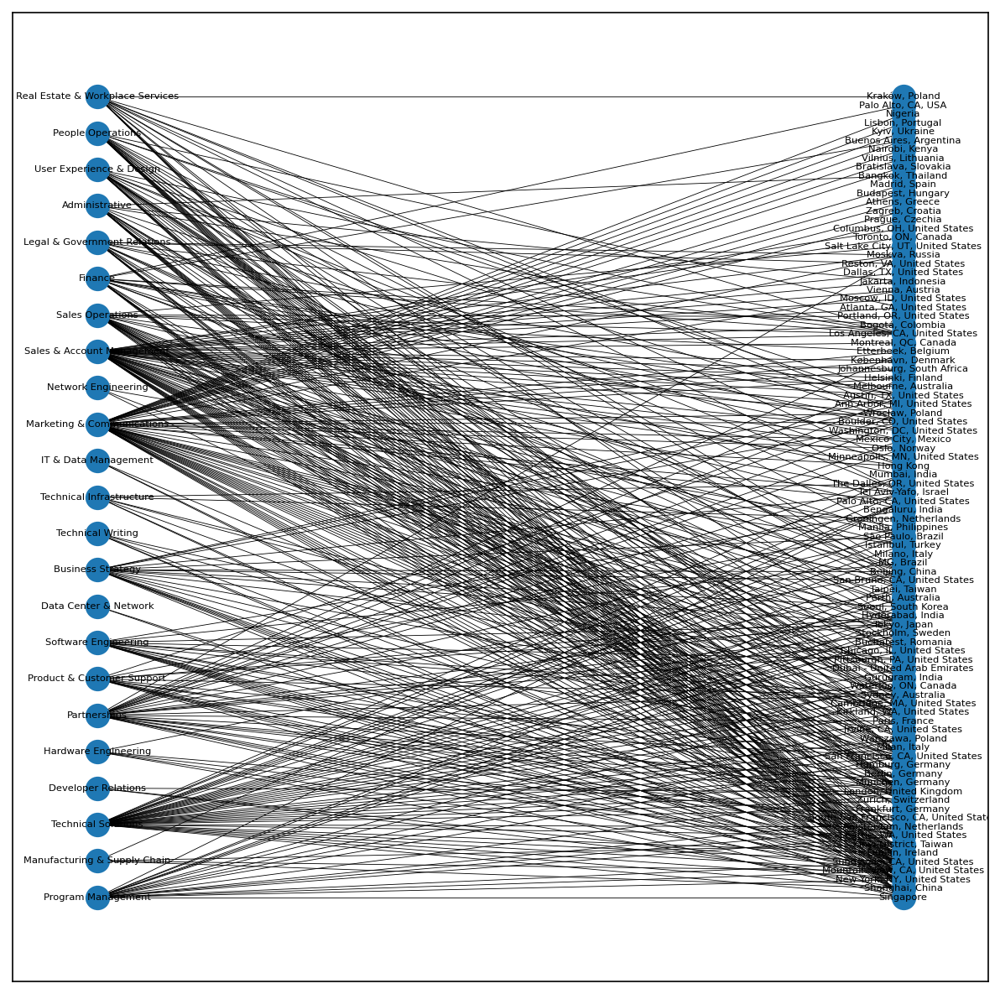

In [ ]:
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(B)
fix, ax = plt.subplots(1,1,figsize=(10,10),dpi=150)
nx.draw_networkx(B, pos=nx.drawing.layout.bipartite_layout(B,Category),font_size=5.5, width=0.4 , node_size=170)

##Hiển thị đồ thị một phía

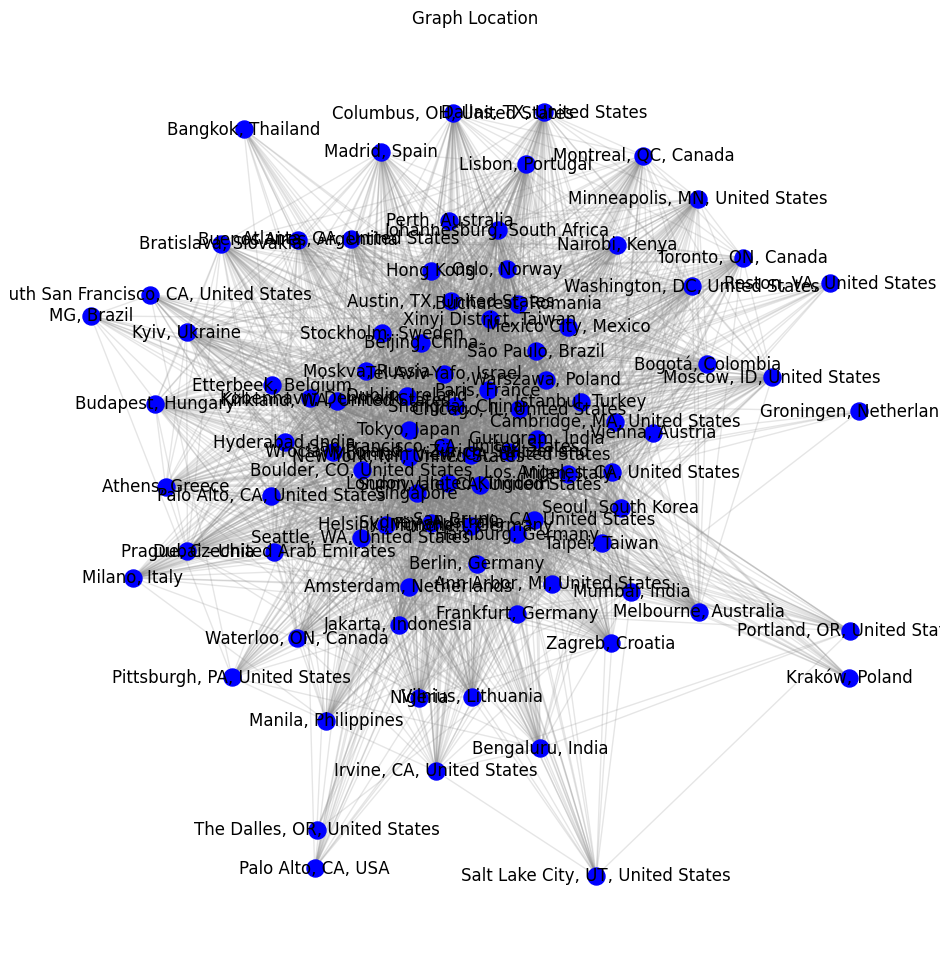

In [ ]:
Location = list(set(Location))
G = bipartite.weighted_projected_graph(B, Location)

layout = nx.spring_layout(G, k=2)

plt.figure(figsize=(12, 12))

nx.draw_networkx_nodes(G, layout, nodelist=Location,node_size =150, node_color='blue')
nx.draw_networkx_edges(G, layout, edge_color='grey', alpha=0.2)
node_labels = dict(zip(Location, Location))
nx.draw_networkx_labels(G, layout, labels=node_labels)
plt.axis('off')
plt.title("Graph Location")

plt.show()

## Xuất dữ liệu đồ thị 1 phía ra file csv để thực hiện trên Gephi

In [ ]:
labels = nx.get_edge_attributes(G, 'weight')
df2 = pd.DataFrame(columns=['source', 'target', 'weight'])
for key, value in labels.items():
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index=True)
df2.to_csv('job_skills_links.csv', index = False, header = True)

Streaming output truncated to the last 5000 lines.
<ipython-input-16-5aa71a738715>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index=True)
<ipython-input-16-5aa71a738715>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index=True)
<ipython-input-16-5aa71a738715>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index=True)
<ipython-input-16-5aa71a738715>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead

#Xếp hạng các đỉnh theo các độ đo và thuật toán

In [ ]:
#Hiển thị node theo table
def print_centrality(centrality, name):
    result = pd.DataFrame(centrality.items(), columns=['Location', name])
    result.sort_values([name,'Location'], ascending=[False,True], inplace=True)
    result.reset_index(drop=True, inplace=True)
    return result

In [ ]:
#Hiển thị node theo table
def print_centrality1(centrality, name):
    result = pd.DataFrame(centrality.items(), columns=['Location', name])
    result.sort_values([name,'Location'], ascending=[False,True], inplace=True)
    result.reset_index(drop=True, inplace=True)
    result = result.iloc[:-1]
    return result

##Degree Centrality

In [ ]:
degree = dict(nx.degree(G),normalize=False)
print_centrality1(degree, 'Degree Centrality')

,Location,Degree Centrality
0,"Mountain View, CA, United States",91
1,"Sunnyvale, CA, United States",91
2,"London, United Kingdom",90
3,"Sydney, Australia",88
4,"San Francisco, CA, United States",87
...,...,...
87,"Kraków, Poland",15
88,"MG, Brazil",15
89,"Reston, VA, United States",15
90,"Groningen, Netherlands",6


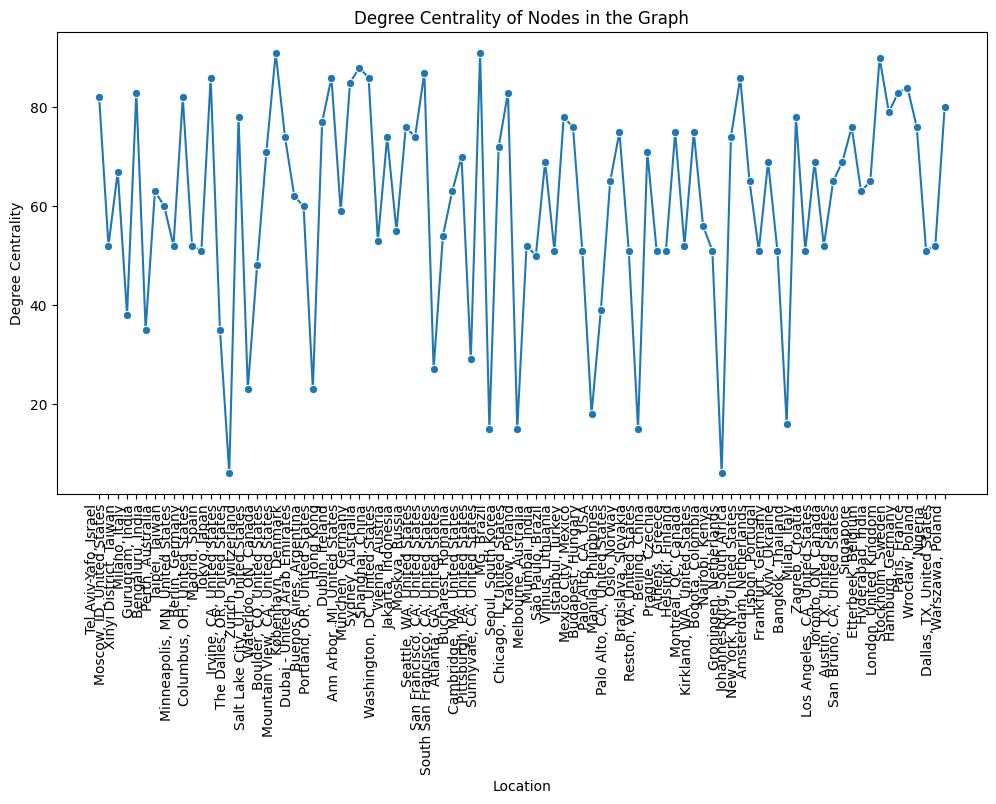

In [ ]:
#Biểu đồ thể hiện giá trị Degree của các node trong Graph
degree_df = pd.DataFrame(degree.items(), columns=['Location', 'Degree Centrality'])
degree_df = degree_df.iloc[:-1]

# Vẽ biểu đồ line chart
plt.figure(figsize=(12, 6))
sns.lineplot(x='Location', y='Degree Centrality', data=degree_df, marker='o')
plt.xlabel('Location')
plt.ylabel('Degree Centrality')
plt.title('Degree Centrality of Nodes in the Graph')
plt.xticks(rotation=90, ha="right")
plt.show()

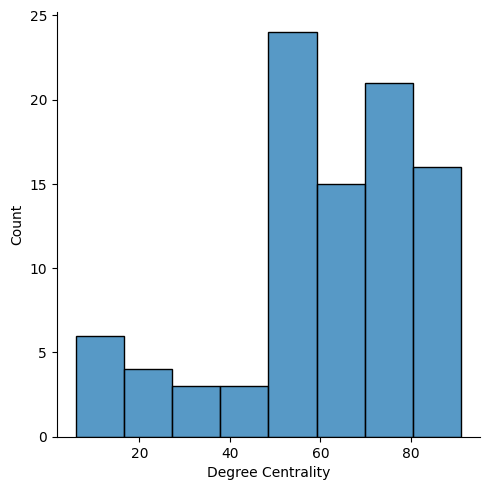

In [ ]:
#Biểu đồ thể hiện sự phân bố Degree Centrality của các node trong Graph
sns.displot(x='Degree Centrality',data=degree_df)

In [ ]:
#Top 10 đỉnh có Degree Centrality cao nhất
print_centrality1(degree, 'Degree Centrality').head(10)

,Location,Degree Centrality
0,"Mountain View, CA, United States",91
1,"Sunnyvale, CA, United States",91
2,"London, United Kingdom",90
3,"Sydney, Australia",88
4,"San Francisco, CA, United States",87
5,"Dublin, Ireland",86
6,"New York, NY, United States",86
7,"Shanghai, China",86
8,"Tokyo, Japan",86
9,"München, Germany",85


In [ ]:
#Top 10 đỉnh có Degree Centrality thấp nhất
print_centrality1(degree, 'Degree Centrality').tail(10).sort_values('Degree Centrality', ascending=True).reset_index(drop=True)

,Location,Degree Centrality
0,"Groningen, Netherlands",6
1,"The Dalles, OR, United States",6
2,"Kraków, Poland",15
3,"MG, Brazil",15
4,"Reston, VA, United States",15
5,"Bangkok, Thailand",16
6,"Palo Alto, CA, USA",18
7,"Portland, OR, United States",23
8,"Salt Lake City, UT, United States",23
9,"South San Francisco, CA, United States",27


##Betweenness Centrality

In [ ]:
betweenness = nx.betweenness_centrality(G,normalized=False)
print_centrality(betweenness, 'Betweenness Centrality')

,Location,Betweenness Centrality
0,"Mountain View, CA, United States",97.161268
1,"Sunnyvale, CA, United States",97.161268
2,"London, United Kingdom",90.028309
3,"Sydney, Australia",77.452414
4,"San Francisco, CA, United States",47.609905
...,...,...
87,"Salt Lake City, UT, United States",0.000000
88,"The Dalles, OR, United States",0.000000
89,"Toronto, ON, Canada",0.000000
90,"Vilnius, Lithuania",0.000000


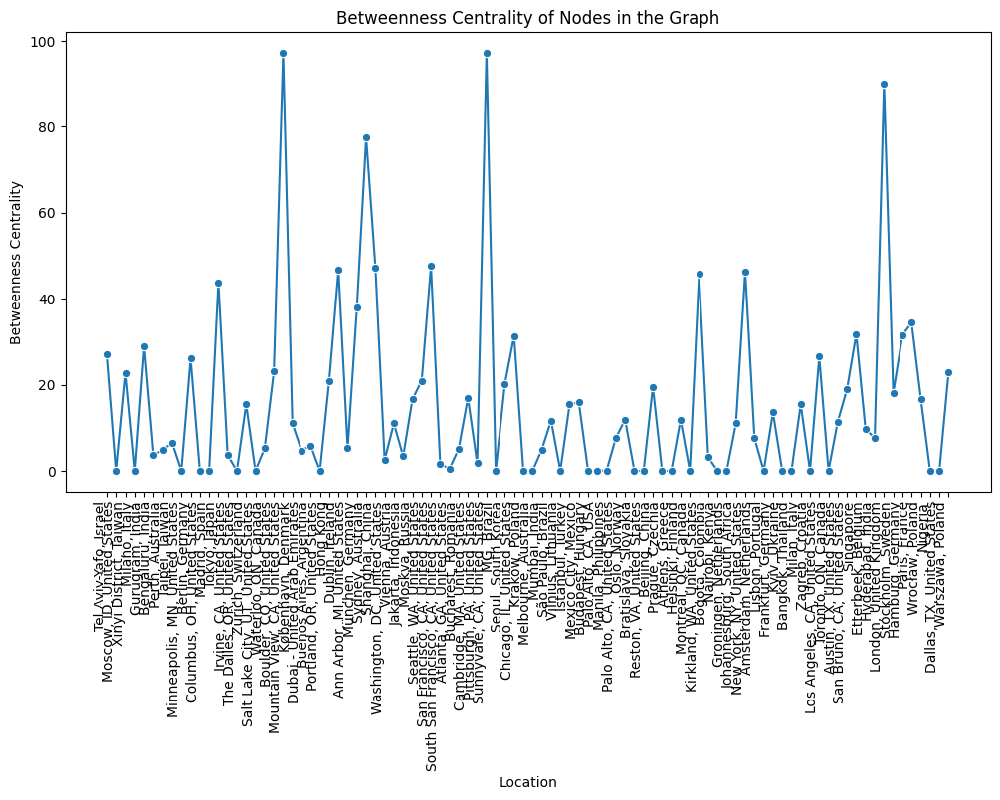

In [ ]:
#Biểu đồ thể hiện giá trị Betweennness của các node trong Graph
betweenness_df = pd.DataFrame(betweenness.items(), columns=['Location', 'Betweenness Centrality'])

# Vẽ biểu đồ line chart
plt.figure(figsize=(12, 6))
sns.lineplot(x='Location', y='Betweenness Centrality', data=betweenness_df, marker='o')
plt.xlabel('Location')
plt.ylabel('Betweenness Centrality')
plt.title('Betweenness Centrality of Nodes in the Graph')
plt.xticks(rotation=90, ha="right")
plt.show()

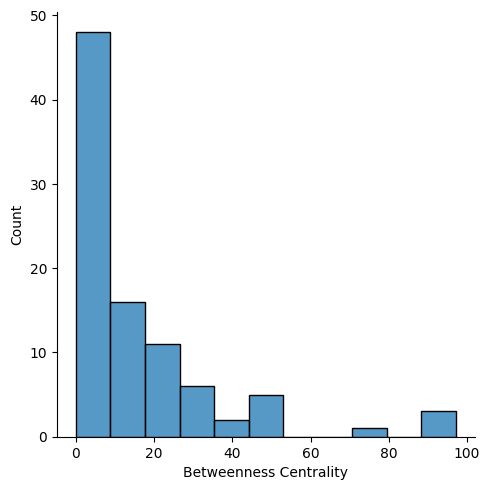

In [ ]:
#Biểu đồ thể hiện sự phân bố Betweenness Centrality của các node trong Graph
sns.displot(x='Betweenness Centrality',data=betweenness_df)

In [ ]:
#Top 10 đỉnh có Betweenness Centrality cao nhất
print_centrality(betweenness, 'Betweenness Centrality').head(10)

,Location,Betweenness Centrality
0,"Mountain View, CA, United States",97.161268
1,"Sunnyvale, CA, United States",97.161268
2,"London, United Kingdom",90.028309
3,"Sydney, Australia",77.452414
4,"San Francisco, CA, United States",47.609905
5,"Shanghai, China",47.279814
6,"Dublin, Ireland",46.637197
7,"New York, NY, United States",46.355237
8,"Kirkland, WA, United States",45.788438
9,"Tokyo, Japan",43.745598


In [ ]:
#Top 10 đỉnh có Betweenness Centrality thấp nhất
print_centrality(betweenness, 'Betweenness Centrality').tail(10)

,Location,Betweenness Centrality
82,Nigeria,0.0
83,"Palo Alto, CA, USA",0.0
84,"Portland, OR, United States",0.0
85,"Prague, Czechia",0.0
86,"Reston, VA, United States",0.0
87,"Salt Lake City, UT, United States",0.0
88,"The Dalles, OR, United States",0.0
89,"Toronto, ON, Canada",0.0
90,"Vilnius, Lithuania",0.0
91,"Zagreb, Croatia",0.0


##Closeness centrality

In [ ]:
closeness = nx.closeness_centrality(G)
print_centrality(closeness, 'Closeness Centrality')

,Location,Closeness Centrality
0,"Mountain View, CA, United States",1.000000
1,"Sunnyvale, CA, United States",1.000000
2,"London, United Kingdom",0.989130
3,"Sydney, Australia",0.968085
4,"San Francisco, CA, United States",0.957895
...,...,...
87,"Kraków, Poland",0.544910
88,"MG, Brazil",0.544910
89,"Reston, VA, United States",0.544910
90,"Groningen, Netherlands",0.517045


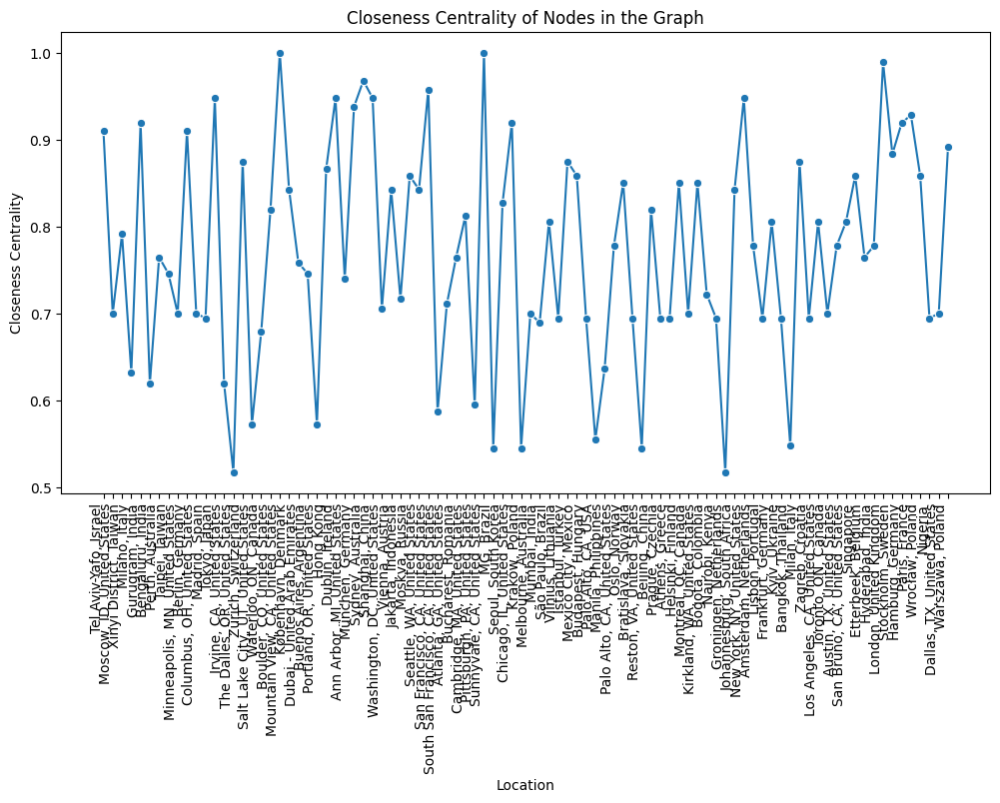

In [ ]:
#Biểu đồ thể hiện giá trị Closeness của các node trong Graph
closeness_df = pd.DataFrame(closeness.items(), columns=['Location', 'Closeness Centrality'])

# Vẽ biểu đồ line chart
plt.figure(figsize=(12, 6))
sns.lineplot(x='Location', y='Closeness Centrality', data=closeness_df, marker='o')
plt.xlabel('Location')
plt.ylabel('Closeness Centrality')
plt.title('Closeness Centrality of Nodes in the Graph')
plt.xticks(rotation=90, ha="right")
plt.show()

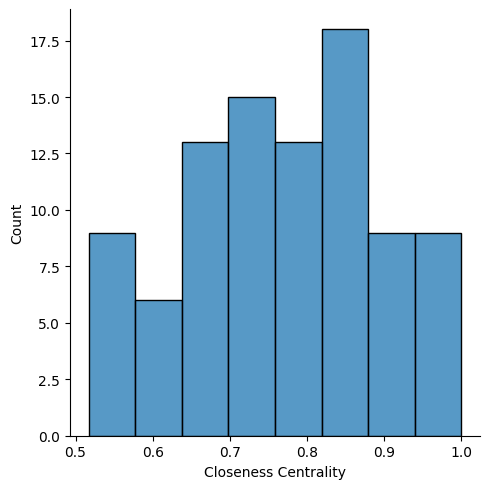

In [ ]:
#Biểu đồ thể hiện sự phân bố Closeness Centrality của các node trong Graph
sns.displot(x='Closeness Centrality',data=closeness_df)

In [ ]:
#Top 10 đỉnh có Closeness Centrality cao nhất
print_centrality(closeness, 'Closeness Centrality').head(10)

,Location,Closeness Centrality
0,"Mountain View, CA, United States",1.000000
1,"Sunnyvale, CA, United States",1.000000
2,"London, United Kingdom",0.989130
3,"Sydney, Australia",0.968085
4,"San Francisco, CA, United States",0.957895
5,"Dublin, Ireland",0.947917
6,"New York, NY, United States",0.947917
7,"Shanghai, China",0.947917
8,"Tokyo, Japan",0.947917
9,"München, Germany",0.938144


In [ ]:
#Top 10 đỉnh có Closeness Centrality Thấp nhất
print_centrality(closeness, 'Closeness Centrality').tail(10).sort_values('Closeness Centrality', ascending=True).reset_index(drop=True)

,Location,Closeness Centrality
0,"Groningen, Netherlands",0.517045
1,"The Dalles, OR, United States",0.517045
2,"Kraków, Poland",0.544910
3,"MG, Brazil",0.544910
4,"Reston, VA, United States",0.544910
5,"Bangkok, Thailand",0.548193
6,"Palo Alto, CA, USA",0.554878
7,"Portland, OR, United States",0.572327
8,"Salt Lake City, UT, United States",0.572327
9,"South San Francisco, CA, United States",0.587097


## Clustering coefficient

In [ ]:
clustering_coefficient = nx.clustering(G)
print_centrality(clustering_coefficient, 'Clustering coefficient')

,Location,Clustering coefficient
0,"Athens, Greece",1.000000
1,"Bangkok, Thailand",1.000000
2,"Bratislava, Slovakia",1.000000
3,"Budapest, Hungary",1.000000
4,"Columbus, OH, United States",1.000000
...,...,...
87,"San Francisco, CA, United States",0.709703
88,"Sydney, Australia",0.691484
89,"London, United Kingdom",0.668664
90,"Mountain View, CA, United States",0.657387


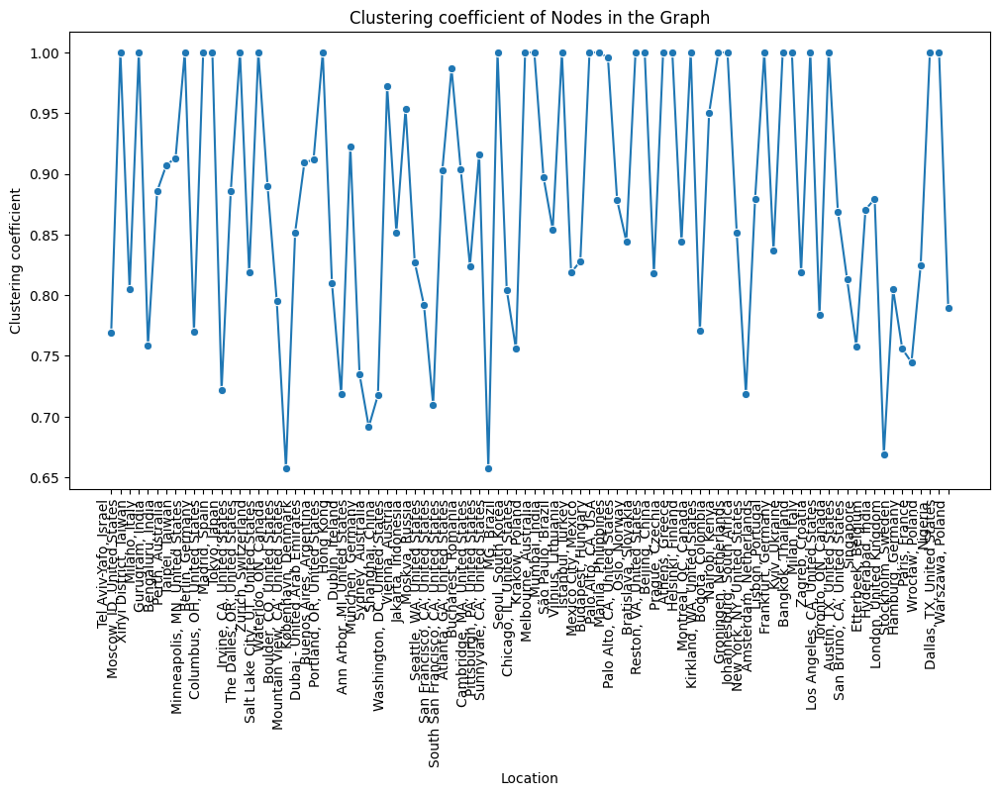

In [ ]:
#Biểu đồ thể hiện giá trị Clustering coefficient của các node trong Graph
clustering_coefficient_df = pd.DataFrame(clustering_coefficient.items(), columns=['Location', 'Clustering coefficient'])
# Vẽ biểu đồ line chart
plt.figure(figsize=(12, 6))
sns.lineplot(x='Location', y='Clustering coefficient', data=clustering_coefficient_df, marker='o')
plt.xlabel('Location')
plt.ylabel('Clustering coefficient')
plt.title('Clustering coefficient of Nodes in the Graph')
plt.xticks(rotation=90, ha="right")
plt.show()

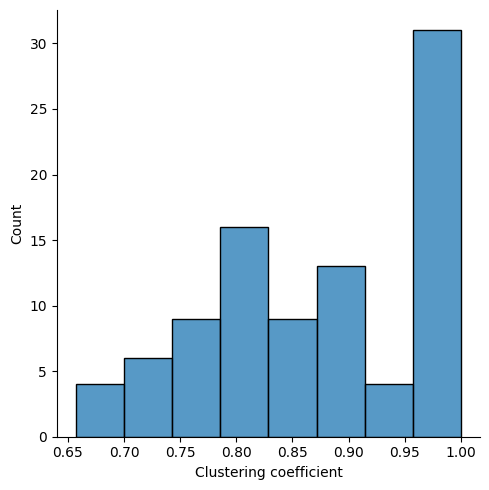

In [ ]:
#Biểu đồ thể hiện sự phân bố Clustering coefficient của các node trong Graph
sns.displot(x='Clustering coefficient',data=clustering_coefficient_df)

In [ ]:
#Top 10 đỉnh có Clustering coefficient cao nhất
print_centrality(clustering_coefficient, 'Clustering coefficient').head(10)

,Location,Clustering coefficient
0,"Athens, Greece",1.0
1,"Bangkok, Thailand",1.0
2,"Bratislava, Slovakia",1.0
3,"Budapest, Hungary",1.0
4,"Columbus, OH, United States",1.0
5,"Dallas, TX, United States",1.0
6,"Groningen, Netherlands",1.0
7,"Kraków, Poland",1.0
8,"Kyiv, Ukraine",1.0
9,"Lisbon, Portugal",1.0


In [ ]:
#Top 10 đỉnh có Clustering coefficient thấp nhất
print_centrality(clustering_coefficient, 'Clustering coefficient').tail(10).sort_values('Clustering coefficient').reset_index(drop=True)

,Location,Clustering coefficient
0,"Mountain View, CA, United States",0.657387
1,"Sunnyvale, CA, United States",0.657387
2,"London, United Kingdom",0.668664
3,"Sydney, Australia",0.691484
4,"San Francisco, CA, United States",0.709703
5,"Shanghai, China",0.717647
6,"Dublin, Ireland",0.718468
7,"New York, NY, United States",0.718468
8,"Tokyo, Japan",0.721477
9,"München, Germany",0.734734


##Harmonic

In [ ]:
harmonic_closeness = nx.harmonic_centrality(G)
print_centrality(harmonic_closeness, 'Harmonic Closeness Centrality')

,Location,Harmonic Closeness Centrality
0,"Mountain View, CA, United States",91.0
1,"Sunnyvale, CA, United States",91.0
2,"London, United Kingdom",90.5
3,"Sydney, Australia",89.5
4,"San Francisco, CA, United States",89.0
...,...,...
87,"Kraków, Poland",53.0
88,"MG, Brazil",53.0
89,"Reston, VA, United States",53.0
90,"Groningen, Netherlands",48.5


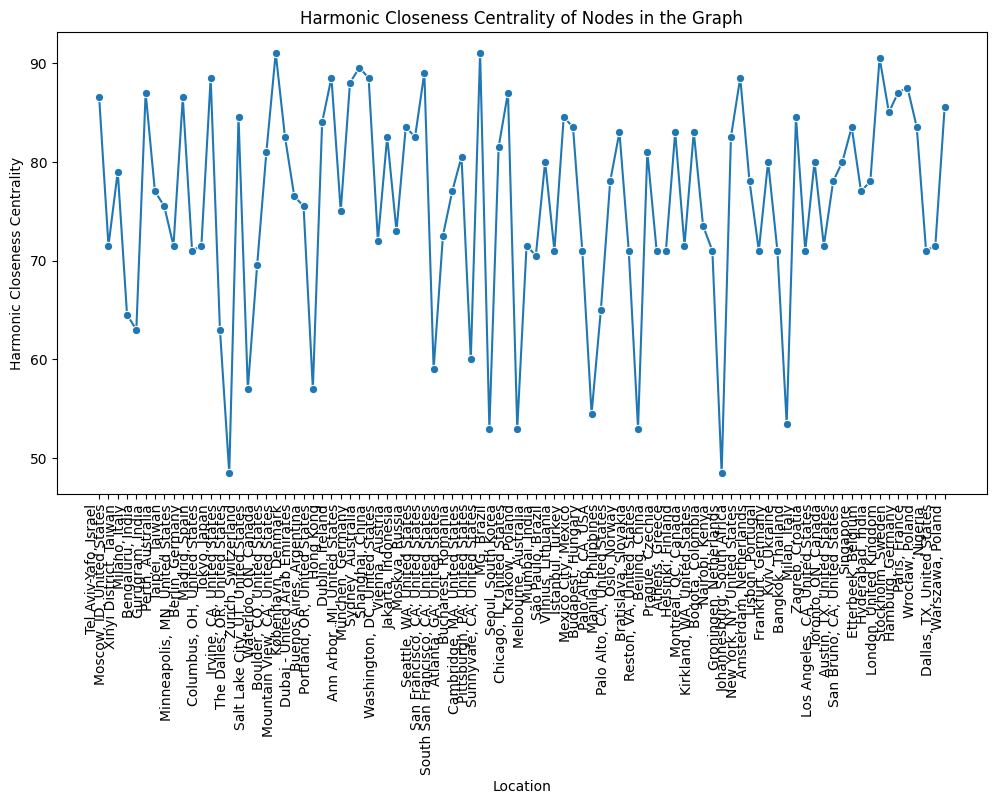

In [ ]:
#Biểu đồ thể hiện giá trị Harmonic của các node trong Graph
harmonic_closeness_df = pd.DataFrame(harmonic_closeness.items(), columns=['Location', 'Harmonic Closeness Centrality'])
# Vẽ biểu đồ line chart
plt.figure(figsize=(12, 6))
sns.lineplot(x='Location', y='Harmonic Closeness Centrality', data=harmonic_closeness_df, marker='o')
plt.xlabel('Location')
plt.ylabel('Harmonic Closeness Centrality')
plt.title('Harmonic Closeness Centrality of Nodes in the Graph')
plt.xticks(rotation=90, ha="right")
plt.show()

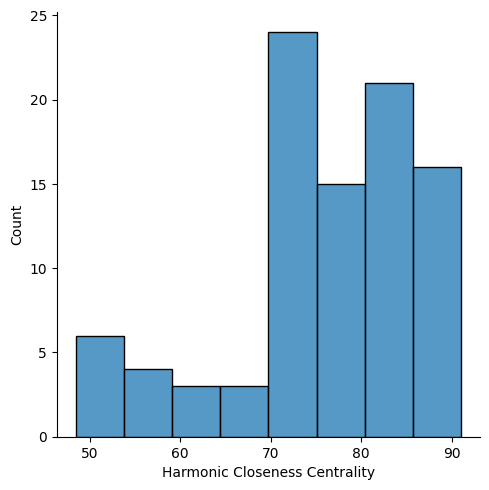

In [ ]:
#Biểu đồ thể hiện sự phân bố Harmonic của các node trong Graph
sns.displot(x='Harmonic Closeness Centrality',data=harmonic_closeness_df)

In [ ]:
#Top 10 đỉnh có Harmonic cao nhất
print_centrality(harmonic_closeness, 'Harmonic Closeness Centrality').head(10)

,Location,Harmonic Closeness Centrality
0,"Mountain View, CA, United States",91.0
1,"Sunnyvale, CA, United States",91.0
2,"London, United Kingdom",90.5
3,"Sydney, Australia",89.5
4,"San Francisco, CA, United States",89.0
5,"Dublin, Ireland",88.5
6,"New York, NY, United States",88.5
7,"Shanghai, China",88.5
8,"Tokyo, Japan",88.5
9,"München, Germany",88.0


In [ ]:
#Top 10 đỉnh có Harmonic thấp nhất
print_centrality(harmonic_closeness, 'Harmonic Closeness Centrality').tail(10).sort_values('Harmonic Closeness Centrality').reset_index(drop=True)

,Location,Harmonic Closeness Centrality
0,"Groningen, Netherlands",48.5
1,"The Dalles, OR, United States",48.5
2,"Kraków, Poland",53.0
3,"MG, Brazil",53.0
4,"Reston, VA, United States",53.0
5,"Bangkok, Thailand",53.5
6,"Palo Alto, CA, USA",54.5
7,"Portland, OR, United States",57.0
8,"Salt Lake City, UT, United States",57.0
9,"South San Francisco, CA, United States",59.0


##Eigenvector

In [ ]:
eigenvector = nx.eigenvector_centrality(G)
print_centrality(eigenvector, 'Eigenvector Centrality')

,Location,Eigenvector Centrality
0,"Mountain View, CA, United States",0.134074
1,"Sunnyvale, CA, United States",0.134074
2,"London, United Kingdom",0.133667
3,"San Francisco, CA, United States",0.133030
4,"Sydney, Australia",0.132804
...,...,...
87,"Kraków, Poland",0.027708
88,"Reston, VA, United States",0.027262
89,"MG, Brazil",0.024142
90,"Groningen, Netherlands",0.009874


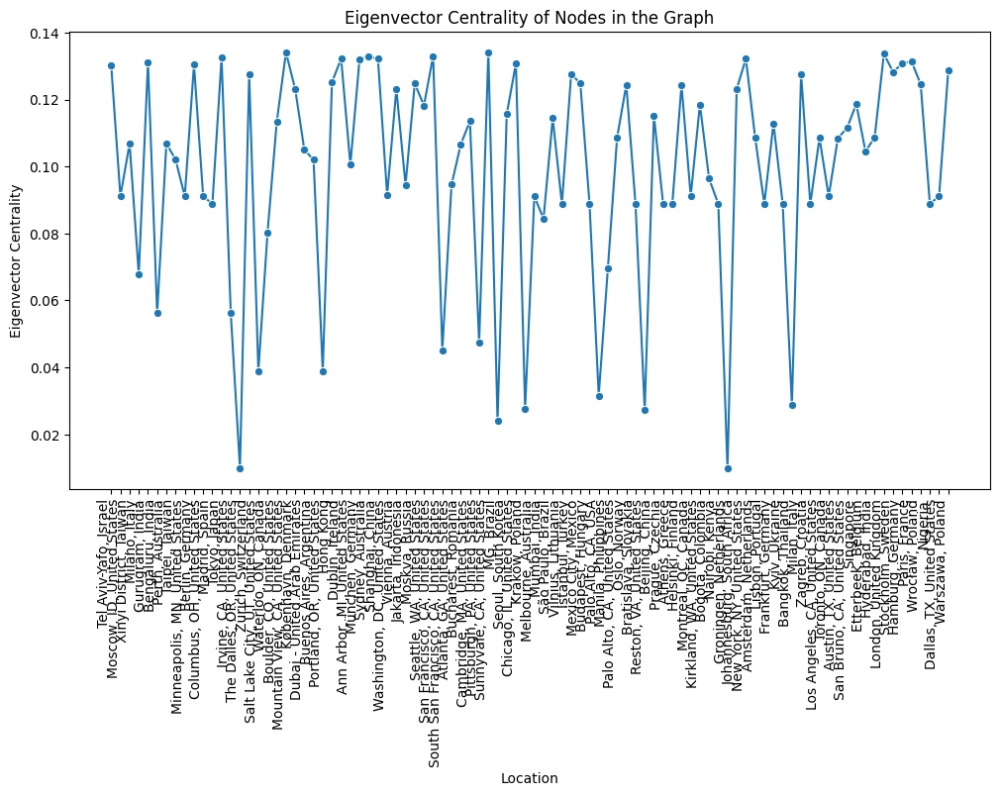

In [ ]:
#Biểu đồ thể hiện giá trị Eigenvector của các node trong Graph
eigenvector_df = pd.DataFrame(eigenvector.items(), columns=['Location', 'Eigenvector Centrality'])
# Vẽ biểu đồ line chart
plt.figure(figsize=(12, 6))
sns.lineplot(x='Location', y='Eigenvector Centrality', data=eigenvector_df, marker='o')
plt.xlabel('Location')
plt.ylabel('Eigenvector Centrality')
plt.title('Eigenvector Centrality of Nodes in the Graph')
plt.xticks(rotation=90, ha="right")
plt.show()

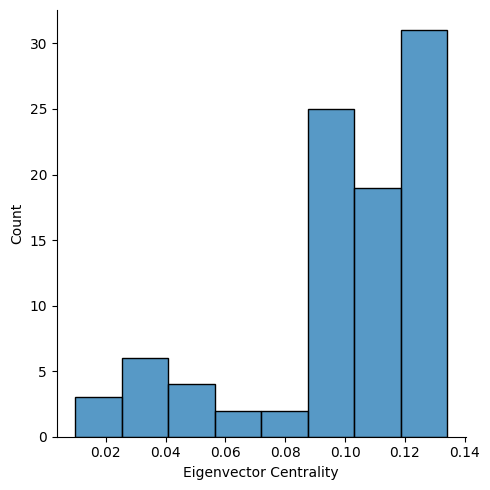

In [ ]:
#Biểu đồ thể hiện sự phân bố Eigenvector của các node trong Graph
sns.displot(x='Eigenvector Centrality',data=eigenvector_df)

In [ ]:
#Top 10 đỉnh có Eigenvector Centrality cao nhất
print_centrality(eigenvector, 'Eigenvector Centrality').head(10)

,Location,Eigenvector Centrality
0,"Mountain View, CA, United States",0.134074
1,"Sunnyvale, CA, United States",0.134074
2,"London, United Kingdom",0.133667
3,"San Francisco, CA, United States",0.133030
4,"Sydney, Australia",0.132804
5,"Tokyo, Japan",0.132492
6,"New York, NY, United States",0.132241
7,"Dublin, Ireland",0.132235
8,"Shanghai, China",0.132178
9,"München, Germany",0.132092


In [ ]:
#Top 10 đỉnh có Eigenvector Centrality thấp nhất
print_centrality(eigenvector, 'Eigenvector Centrality').tail(10).sort_values('Eigenvector Centrality').reset_index(drop=True)

,Location,Eigenvector Centrality
0,"Groningen, Netherlands",0.009874
1,"The Dalles, OR, United States",0.009874
2,"MG, Brazil",0.024142
3,"Reston, VA, United States",0.027262
4,"Kraków, Poland",0.027708
5,"Bangkok, Thailand",0.028773
6,"Palo Alto, CA, USA",0.031574
7,"Portland, OR, United States",0.038931
8,"Salt Lake City, UT, United States",0.038931
9,"South San Francisco, CA, United States",0.045112


##PageRank

In [ ]:
pagerank = nx.pagerank(G, tol=1e-6, alpha=0.85)
print_centrality(pagerank, 'PageRank')

,Location,PageRank
0,"Mountain View, CA, United States",0.030439
1,"Sunnyvale, CA, United States",0.029682
2,"London, United Kingdom",0.028444
3,"San Francisco, CA, United States",0.026415
4,"New York, NY, United States",0.026061
...,...,...
87,"MG, Brazil",0.002784
88,"Reston, VA, United States",0.002718
89,"Kraków, Poland",0.002709
90,"Groningen, Netherlands",0.002311


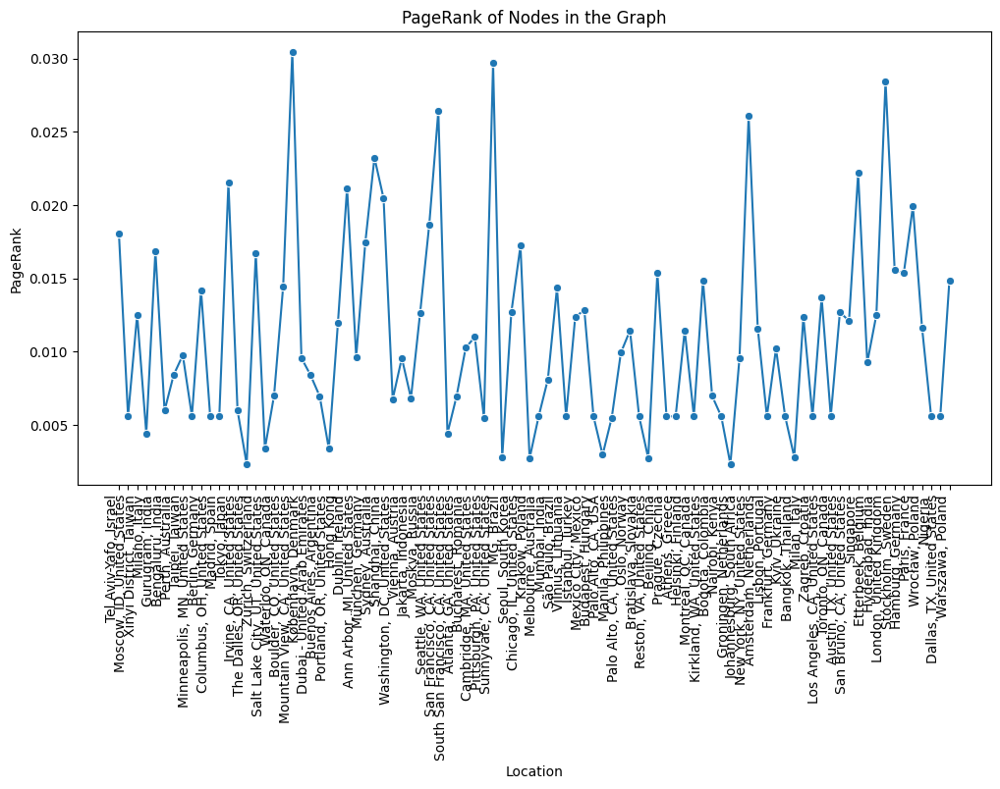

In [ ]:
#Biểu đồ thể hiện giá trị Clustering coefficient của các node trong Graph
pagerank_df = pd.DataFrame(pagerank.items(), columns=['Location', 'PageRank'])
# Vẽ biểu đồ line chart
plt.figure(figsize=(12, 6))
sns.lineplot(x='Location', y='PageRank', data=pagerank_df, marker='o')
plt.xlabel('Location')
plt.ylabel('PageRank')
plt.title('PageRank of Nodes in the Graph')
plt.xticks(rotation=90, ha="right")
plt.show()

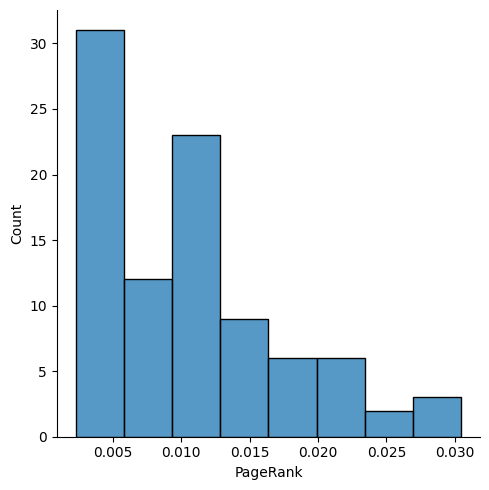

In [ ]:
#Biểu đồ thể hiện sự phân bố PageRank của các node trong Graph
sns.displot(x='PageRank',data=pagerank_df)

In [ ]:
#Top 10 đỉnh có PageRank cao nhất
print_centrality(pagerank, 'PageRank').head(10)

,Location,PageRank
0,"Mountain View, CA, United States",0.030439
1,"Sunnyvale, CA, United States",0.029682
2,"London, United Kingdom",0.028444
3,"San Francisco, CA, United States",0.026415
4,"New York, NY, United States",0.026061
5,"Sydney, Australia",0.023225
6,Singapore,0.022171
7,"Tokyo, Japan",0.021508
8,"Dublin, Ireland",0.021157
9,"Shanghai, China",0.020451


In [ ]:
#Top 10 đỉnh có PageRank thấp nhất
print_centrality(pagerank, 'PageRank').tail(10).sort_values('PageRank').reset_index(drop=True).reset_index(drop=True)

,Location,PageRank
0,"Groningen, Netherlands",0.002311
1,"The Dalles, OR, United States",0.002311
2,"Kraków, Poland",0.002709
3,"Reston, VA, United States",0.002718
4,"MG, Brazil",0.002784
5,"Bangkok, Thailand",0.002794
6,"Palo Alto, CA, USA",0.002946
7,"Portland, OR, United States",0.003377
8,"Salt Lake City, UT, United States",0.003377
9,"Milano, Italy",0.004411


#Các thuật toán phát hiện cộng đồng

In [ ]:
#Nhóm các cột theo cột ý nghĩa(cột 2)
df_groupby_secondary = df.groupby([SECONDARY])[PRIMARY].apply(lambda x: sorted(set(x)))
df_groupby_secondary = df_groupby_secondary.reset_index()
df_groupby_secondary.head()

,Category,Location
0,Administrative,"[Bangkok, Thailand, Beijing, China, Dublin, Ir..."
1,Business Strategy,"[Ann Arbor, MI, United States, Austin, TX, Uni..."
2,Data Center & Network,"[New York, NY, United States, Sunnyvale, CA, U..."
3,Developer Relations,"[London, United Kingdom, Mountain View, CA, Un..."
4,Finance,"[Ann Arbor, MI, United States, Austin, TX, Uni..."


In [ ]:
#Hàm hiển thị cột SECONDARY
def get_cluster_common_values(cluster):
    commons = []
    for index, row in df_groupby_secondary.iterrows():
        if set(cluster).issubset(row[PRIMARY]):
            commons.append(row[SECONDARY])
    return commons

In [ ]:
# Hiển thị số cụm, số lượng, các node trong cụm
def print_communities(node_groups):
    print('Số lượng cụm là:', len(node_groups))
    for index, cluster in enumerate(node_groups):
        cluster = sorted(cluster)
        common_values = sorted(get_cluster_common_values(cluster))

        print(f'\nCluster {index}:')
        print(f"- {len(cluster)} Nodes: {', '.join(cluster)}")

In [ ]:
#Biểu diễn đồ thị phân cụm
import matplotlib.cm as cm
def plot_communities(nodes, labels):
    cmap = cm.get_cmap('autumn', max(labels) + 1)
    pos = nx.spring_layout(G, k=2)

    plt.figure(figsize=(12, 12))
    nx.draw_networkx_nodes(G, pos, nodes, cmap=cmap, node_color=labels)
    nx.draw_networkx_edges(G, pos, edge_color='grey', alpha=0.2)
    nx.draw_networkx_labels(G, pos)
    plt.axis('off')
    plt.show()

##Thuật toán Louvain

In [ ]:
import community.community_louvain as community_louvain
partition = community_louvain.best_partition(G, resolution=0.95)
louvain_node_groups = [[] for _ in set(partition.values())]

for node, cluster in sorted(partition.items()):
    louvain_node_groups[cluster].append(node)

Số lượng cụm là: 4

Cluster 0:
- 35 Nodes: Ann Arbor, MI, United States, Austin, TX, United States, Bangkok, Thailand, Beijing, China, Bengaluru, India, Boulder, CO, United States, Cambridge, MA, United States, Dublin, Ireland, Groningen, Netherlands, Irvine, CA, United States, Kirkland, WA, United States, Kraków, Poland, London, United Kingdom, Los Angeles, CA, United States, MG, Brazil, Mountain View, CA, United States, New York, NY, United States, Palo Alto, CA, USA, Pittsburgh, PA, United States, Reston, VA, United States, San Bruno, CA, United States, San Francisco, CA, United States, Seattle, WA, United States, Shanghai, China, Singapore, South San Francisco, CA, United States, Sunnyvale, CA, United States, Sydney, Australia, São Paulo, Brazil, Taipei, Taiwan, Tel Aviv-Yafo, Israel, The Dalles, OR, United States, Tokyo, Japan, Waterloo, ON, Canada, Xinyi District, Taiwan

Cluster 1:
- 26 Nodes: Atlanta, GA, United States, Bogotá, Colombia, Columbus, OH, United States, Dallas, TX,

<ipython-input-57-0f99346d6b36>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('autumn', max(labels) + 1)


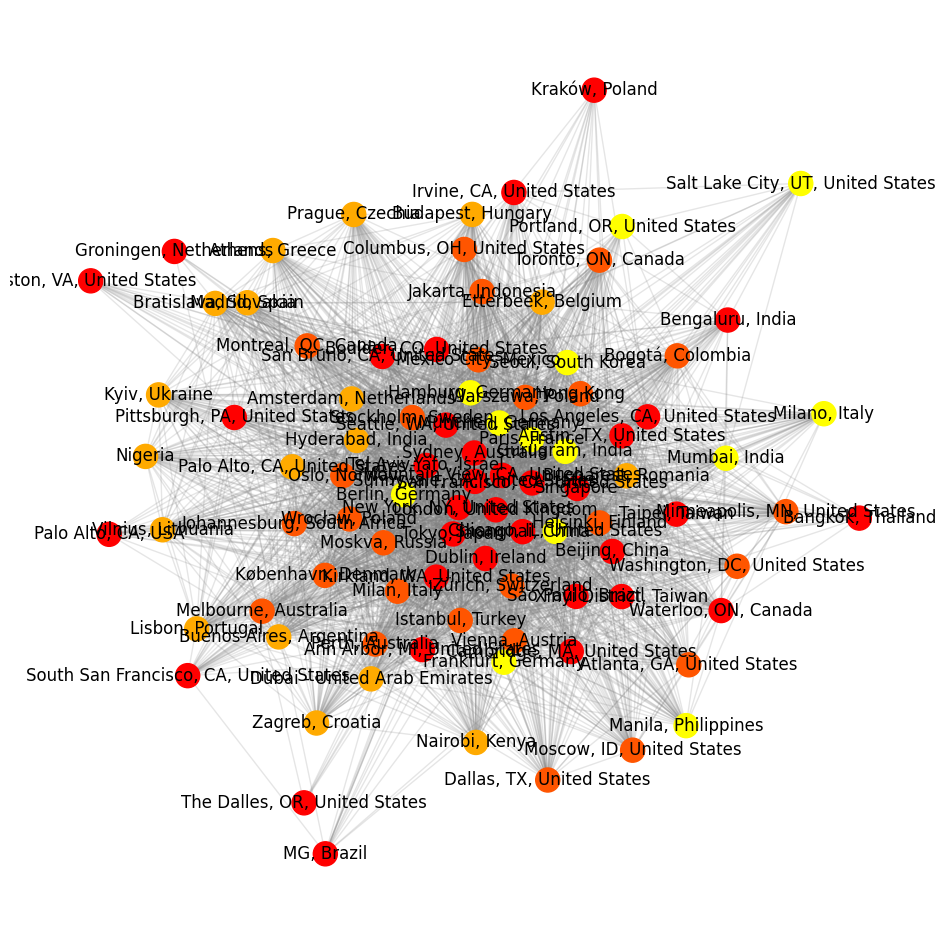

In [ ]:
print_communities(louvain_node_groups)
plot_communities(partition.keys(), list(partition.values()))

In [ ]:
df_copy = dt.copy()

# Add 'cluster' column to the copied DataFrame 'df_copy'
df_copy['cluster'] = -1  # Initialize with a default value, e.g., -1
for cluster, nodes in enumerate(louvain_node_groups):
    df_copy.loc[df_copy['Location'].isin(nodes), 'cluster'] = cluster
df_copy.to_csv('louvain.csv', index=False)

##Thuật toán Girvan-Newman

Số lượng cụm là: 2

Cluster 0:
- 91 Nodes: Amsterdam, Netherlands, Ann Arbor, MI, United States, Athens, Greece, Atlanta, GA, United States, Austin, TX, United States, Bangkok, Thailand, Beijing, China, Bengaluru, India, Berlin, Germany, Bogotá, Colombia, Boulder, CO, United States, Bratislava, Slovakia, Bucharest, Romania, Budapest, Hungary, Buenos Aires, Argentina, Cambridge, MA, United States, Chicago, IL, United States, Columbus, OH, United States, Dallas, TX, United States, Dubai - United Arab Emirates, Dublin, Ireland, Etterbeek, Belgium, Frankfurt, Germany, Gurugram, India, Hamburg, Germany, Helsinki, Finland, Hong Kong, Hyderabad, India, Irvine, CA, United States, Istanbul, Turkey, Jakarta, Indonesia, Johannesburg, South Africa, Kirkland, WA, United States, Kraków, Poland, Kyiv, Ukraine, København, Denmark, Lisbon, Portugal, London, United Kingdom, Los Angeles, CA, United States, MG, Brazil, Madrid, Spain, Manila, Philippines, Melbourne, Australia, Mexico City, Mexico, Milan, I

<ipython-input-57-0f99346d6b36>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('autumn', max(labels) + 1)


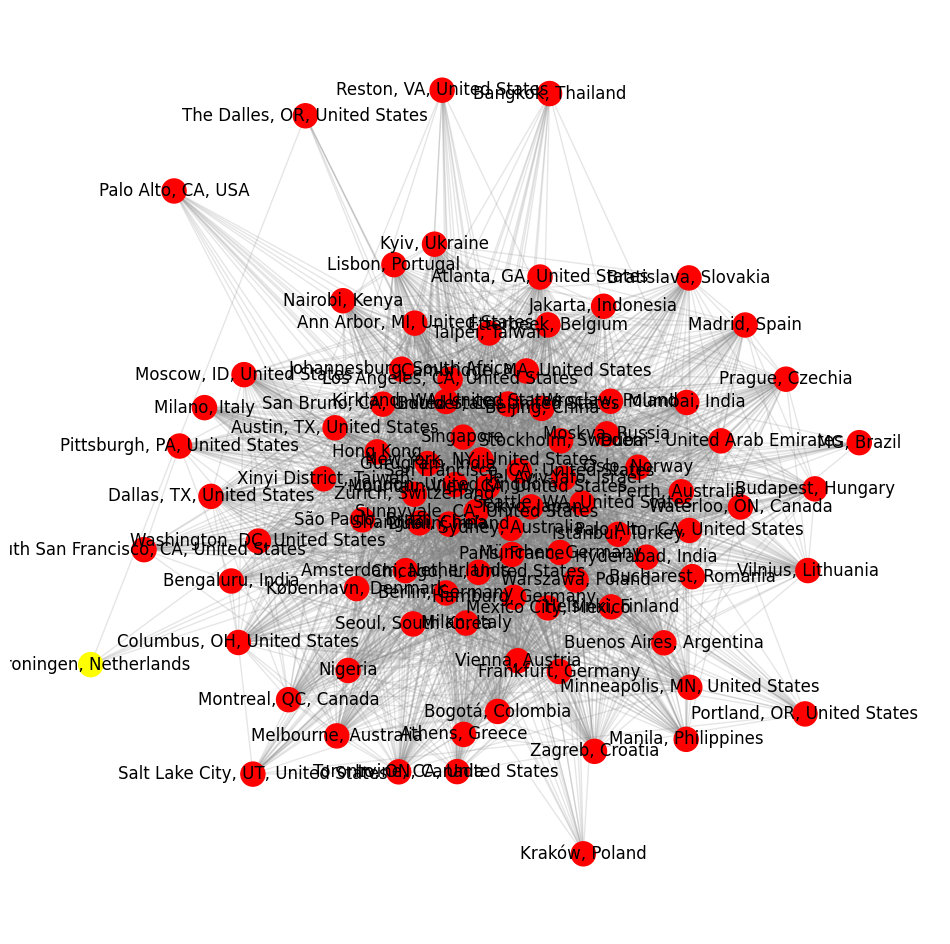

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community.centrality import girvan_newman
import pandas as pd
import matplotlib.cm as cm


gcopy = G.copy()

#Chạy thuật toán girvan-newman
girvan_communities = girvan_newman(gcopy)
node_groups = list(next(girvan_communities))

# Print communities
print_communities(node_groups)

nodes = [node for component in node_groups for node in component]
labels = [i for i, component in enumerate(node_groups) for _ in component]


plot_communities(nodes, labels)

In [ ]:
df_copy = dt.copy()

# Add 'cluster' column to the copied DataFrame 'df_copy'
df_copy['cluster'] = -1  # Initialize with a default value, e.g., -1
for cluster, nodes in enumerate(node_groups):
    df_copy.loc[df_copy['Location'].isin(nodes), 'cluster'] = cluster
df_copy.to_csv('girvannewman.csv', index=False)

##Thuật toán K-means

In [ ]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
adj_matrix = nx.to_numpy_array(G)
adj_matrix

array([[0., 1., 2., ..., 1., 1., 4.],
       [1., 0., 1., ..., 0., 1., 1.],
       [2., 1., 0., ..., 0., 1., 2.],
       ...,
       [1., 0., 0., ..., 0., 0., 1.],
       [1., 1., 1., ..., 0., 0., 1.],
       [4., 1., 2., ..., 1., 1., 0.]])

In [ ]:
import numpy as np
distortions = []
K = range(1, 8)

for k in K:
    kmean_model = KMeans(n_clusters=k)
    kmean_model.fit(adj_matrix)
    dist = sum(np.min(cdist(adj_matrix, kmean_model.cluster_centers_, 'euclidean'), axis=1))
    distortions.append(dist / adj_matrix.shape[0])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

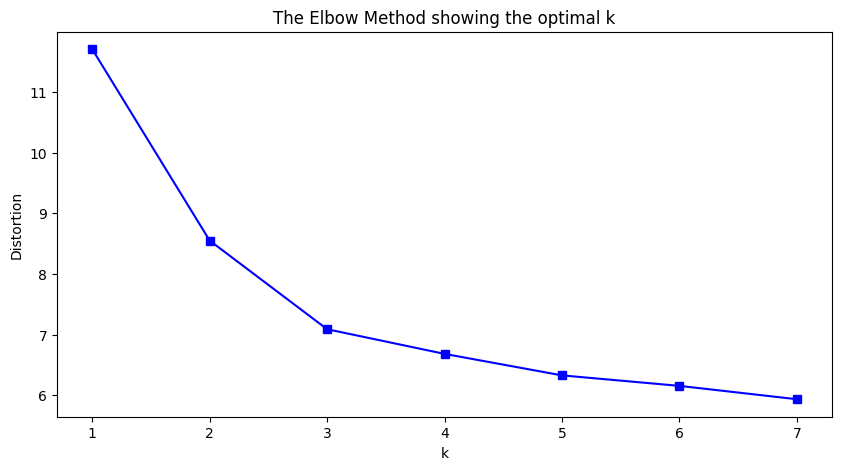

In [ ]:
#Đồ thị lựa chọn k
plt.figure(figsize=(10, 5))
plt.plot(K, distortions, 'bs-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

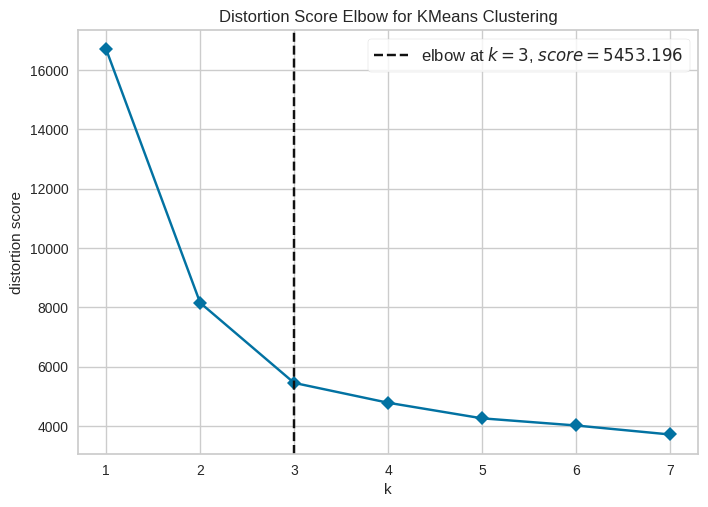

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Visualization with KElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
kmean_model = KMeans()
visualizer = KElbowVisualizer(kmean_model,k=(1,8),timings=False)
visualizer.fit(adj_matrix)
visualizer.show()

In [ ]:
#Chọn số cụm là 3
kmeans = KMeans(n_clusters=3)
kmeans.fit(adj_matrix)

kmeans_node_groups = [[] for _ in range(kmeans.n_clusters)]
for node, cluster in zip(G.nodes(), kmeans.labels_):
    kmeans_node_groups[cluster].append(node)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<ipython-input-57-0f99346d6b36>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('autumn', max(labels) + 1)


Số lượng cụm là: 3

Cluster 0:
- 34 Nodes: Amsterdam, Netherlands, Ann Arbor, MI, United States, Austin, TX, United States, Beijing, China, Berlin, Germany, Boulder, CO, United States, Bucharest, Romania, Cambridge, MA, United States, Chicago, IL, United States, Frankfurt, Germany, Gurugram, India, Hamburg, Germany, Helsinki, Finland, Hong Kong, Hyderabad, India, Istanbul, Turkey, Kirkland, WA, United States, Los Angeles, CA, United States, Mexico City, Mexico, Milan, Italy, Moskva, Russia, München, Germany, Oslo, Norway, Palo Alto, CA, United States, San Bruno, CA, United States, Seoul, South Korea, Stockholm, Sweden, São Paulo, Brazil, Taipei, Taiwan, Tel Aviv-Yafo, Israel, Warszawa, Poland, Wrocław, Poland, Xinyi District, Taiwan, Zürich, Switzerland

Cluster 1:
- 12 Nodes: Dublin, Ireland, London, United Kingdom, Mountain View, CA, United States, New York, NY, United States, Paris, France, San Francisco, CA, United States, Seattle, WA, United States, Shanghai, China, Singapore, Sun

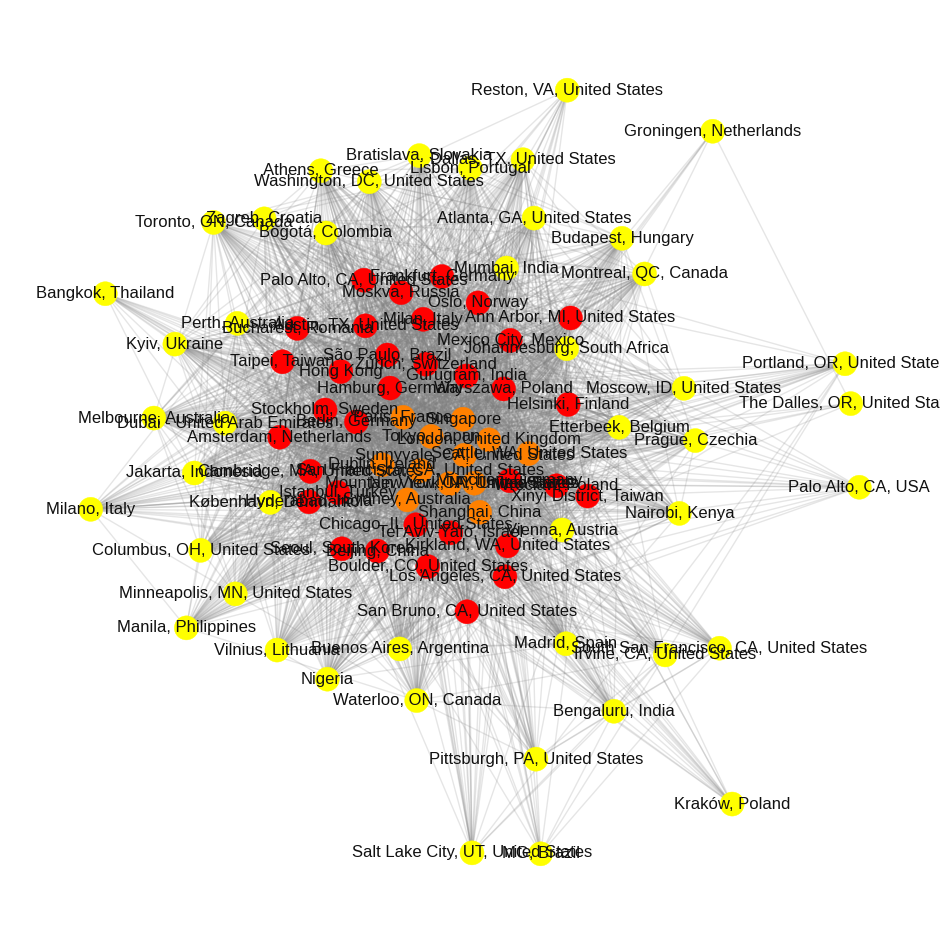

In [ ]:
#In ra node trong cụm và đồ thị phân cụm
print_communities(kmeans_node_groups)
plot_communities(G.nodes(), kmeans.labels_)

In [ ]:
df_copy = dt.copy()

# Add 'cluster' column to the copied DataFrame 'df_copy'
df_copy['cluster'] = -1  # Initialize with a default value, e.g., -1
for cluster, nodes in enumerate(kmeans_node_groups):
    df_copy.loc[df_copy['Location'].isin(nodes), 'cluster'] = cluster
df_copy.to_csv('kmeans.csv', index=False)

##Gausian Mixture Model

In [ ]:
from scipy.spatial.distance import cdist
adj_matrix = nx.to_numpy_array(G)
adj_matrix

array([[0., 1., 2., ..., 1., 1., 4.],
       [1., 0., 1., ..., 0., 1., 1.],
       [2., 1., 0., ..., 0., 1., 2.],
       ...,
       [1., 0., 0., ..., 0., 0., 1.],
       [1., 1., 1., ..., 0., 0., 1.],
       [4., 1., 2., ..., 1., 1., 0.]])

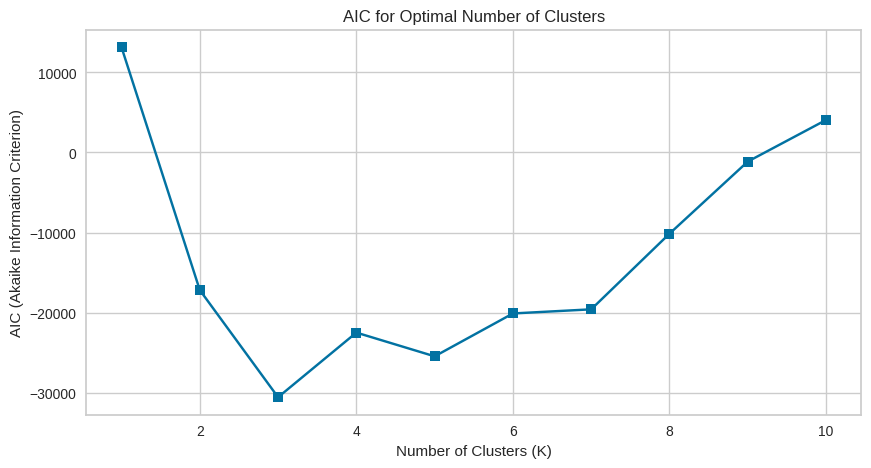

Optimal number of clusters (K) using AIC: 3


In [ ]:
import numpy as np
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

def choose_optimal_k_aic(X, max_clusters=10):
    aic_values = []

    for k in range(1, max_clusters + 1):
        gmm = GaussianMixture(n_components=k)
        gmm.fit(X)
        aic_values.append(gmm.aic(X))

    # Vẽ đồ thị AIC
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, max_clusters + 1), aic_values, 'bs-')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('AIC (Akaike Information Criterion)')
    plt.title('AIC for Optimal Number of Clusters')
    plt.show()

    # Chọn giá trị K tối ưu từ đồ thị AIC
    optimal_k = np.argmin(aic_values) + 1
    print("Optimal number of clusters (K) using AIC:", optimal_k)

    return optimal_k

# Chọn k với aic(adj_matrix là ma trận kề của đồ thị)
optimal_k_aic = choose_optimal_k_aic(adj_matrix, max_clusters=10)

In [ ]:
#Chọn K là 3
from sklearn.mixture import GaussianMixture
n_clusters = 3
gmm = GaussianMixture(n_components=n_clusters)
gmm.fit(adj_matrix)

labels = gmm.predict(adj_matrix)
gmm_node_groups = [[] for _ in range(n_clusters)]
for node, cluster in zip(G.nodes(), labels):
    gmm_node_groups[cluster].append(node)

Số lượng cụm là: 3

Cluster 0:
- 34 Nodes: Amsterdam, Netherlands, Ann Arbor, MI, United States, Austin, TX, United States, Beijing, China, Berlin, Germany, Boulder, CO, United States, Bucharest, Romania, Cambridge, MA, United States, Chicago, IL, United States, Frankfurt, Germany, Gurugram, India, Hamburg, Germany, Helsinki, Finland, Hong Kong, Hyderabad, India, Istanbul, Turkey, Kirkland, WA, United States, Los Angeles, CA, United States, Mexico City, Mexico, Milan, Italy, Moskva, Russia, München, Germany, Oslo, Norway, Palo Alto, CA, United States, San Bruno, CA, United States, Seoul, South Korea, Stockholm, Sweden, São Paulo, Brazil, Taipei, Taiwan, Tel Aviv-Yafo, Israel, Warszawa, Poland, Wrocław, Poland, Xinyi District, Taiwan, Zürich, Switzerland

Cluster 1:
- 12 Nodes: Dublin, Ireland, London, United Kingdom, Mountain View, CA, United States, New York, NY, United States, Paris, France, San Francisco, CA, United States, Seattle, WA, United States, Shanghai, China, Singapore, Sun

<ipython-input-57-0f99346d6b36>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('autumn', max(labels) + 1)


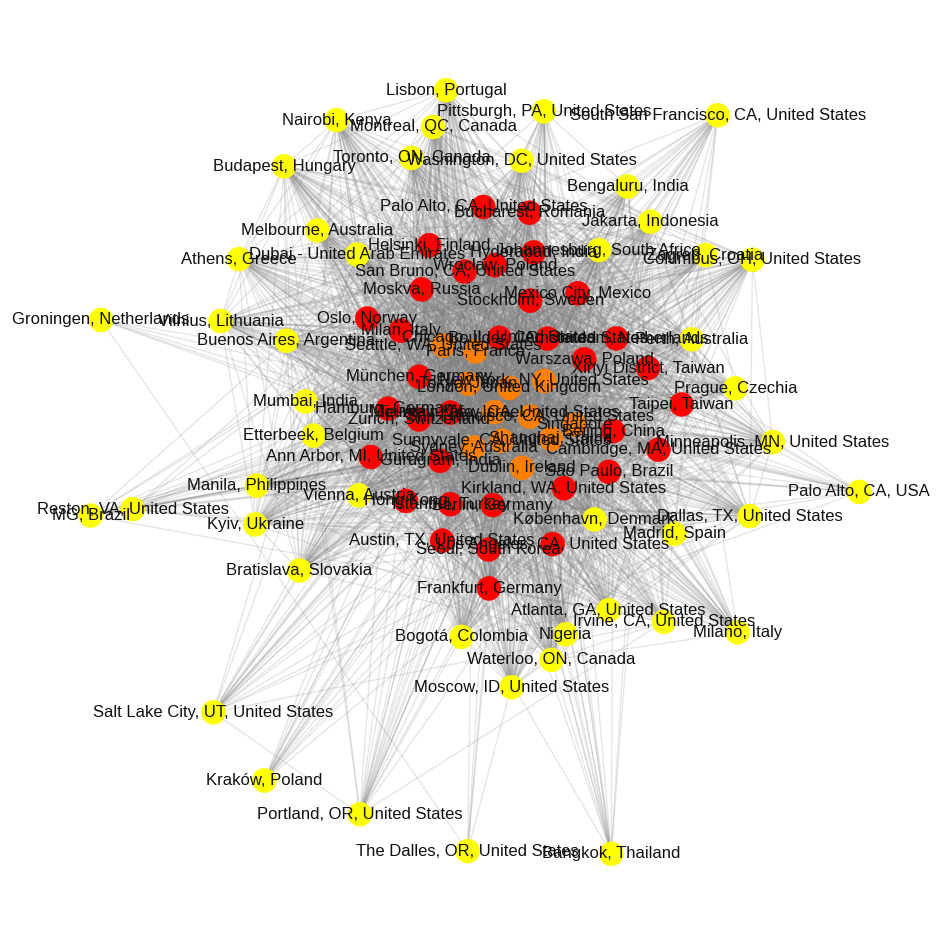

In [ ]:
#Hiển thị node và đồ thị phân cụm
print_communities(gmm_node_groups)
plot_communities(G.nodes(), labels)

In [ ]:
df_copy = dt.copy()

# Add 'cluster' column to the copied DataFrame 'df_copy'
df_copy['cluster'] = -1  # Initialize with a default value, e.g., -1
for cluster, nodes in enumerate(gmm_node_groups):
    df_copy.loc[df_copy['Location'].isin(nodes), 'cluster'] = cluster

# Display the copied DataFrame 'df_copy' with the added 'cluster' column
print(df_copy)
df_copy.to_csv('gausianmix.csv', index=False)

                              Category                          Location  \
0                   Program Management                         Singapore   
1         Manufacturing & Supply Chain                   Shanghai, China   
2                  Technical Solutions       New York, NY, United States   
3                  Developer Relations  Mountain View, CA, United States   
4                   Program Management      Sunnyvale, CA, United States   
...                                ...                               ...   
1245  Real Estate & Workplace Services        Boulder, CO, United States   
1246  Real Estate & Workplace Services        Boulder, CO, United States   
1247  Real Estate & Workplace Services            Xinyi District, Taiwan   
1248  Real Estate & Workplace Services             Tel Aviv-Yafo, Israel   
1249  Real Estate & Workplace Services                   Wrocław, Poland   

      cluster  
0           1  
1           1  
2           1  
3           1  
4      

## Hierarchical Clustering

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

In [ ]:
adj_matrix = nx.to_numpy_array(G)

In [ ]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
model.fit(adj_matrix)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/scipy/cluster/hierarchy.py:833: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='ward', metric='euclidean')


AgglomerativeClustering(affinity='euclidean', n_clusters=3)

In [ ]:
labels = model.labels_
print("Labels:", labels)

Labels: [0 2 0 2 0 2 0 0 2 0 2 2 1 2 2 0 2 2 0 1 0 0 2 2 0 1 0 0 1 1 2 0 2 0 1 1 2
 2 0 0 2 1 2 0 0 2 2 0 0 2 0 0 2 2 2 0 0 2 2 0 2 2 0 2 0 2 2 2 0 1 0 2 0 2
 2 0 2 0 2 0 0 1 0 0 1 0 0 0 0 2 2 0]


In [ ]:
agg_node_groups = [[] for _ in range(model.n_clusters)]
for node, cluster in zip(G.nodes(), model.labels_):
    agg_node_groups[cluster].append(node)

Số lượng cụm là: 3

Cluster 0:
- 42 Nodes: Amsterdam, Netherlands, Ann Arbor, MI, United States, Austin, TX, United States, Beijing, China, Berlin, Germany, Boulder, CO, United States, Bucharest, Romania, Cambridge, MA, United States, Chicago, IL, United States, Dubai - United Arab Emirates, Etterbeek, Belgium, Frankfurt, Germany, Gurugram, India, Hamburg, Germany, Helsinki, Finland, Hong Kong, Hyderabad, India, Istanbul, Turkey, Johannesburg, South Africa, Kirkland, WA, United States, København, Denmark, Los Angeles, CA, United States, Mexico City, Mexico, Milan, Italy, Moskva, Russia, Mumbai, India, München, Germany, Oslo, Norway, Palo Alto, CA, United States, Paris, France, Perth, Australia, San Bruno, CA, United States, Seoul, South Korea, Stockholm, Sweden, São Paulo, Brazil, Taipei, Taiwan, Tel Aviv-Yafo, Israel, Vienna, Austria, Warszawa, Poland, Wrocław, Poland, Xinyi District, Taiwan, Zürich, Switzerland

Cluster 1:
- 11 Nodes: Dublin, Ireland, London, United Kingdom, Mountain

<ipython-input-57-0f99346d6b36>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('autumn', max(labels) + 1)


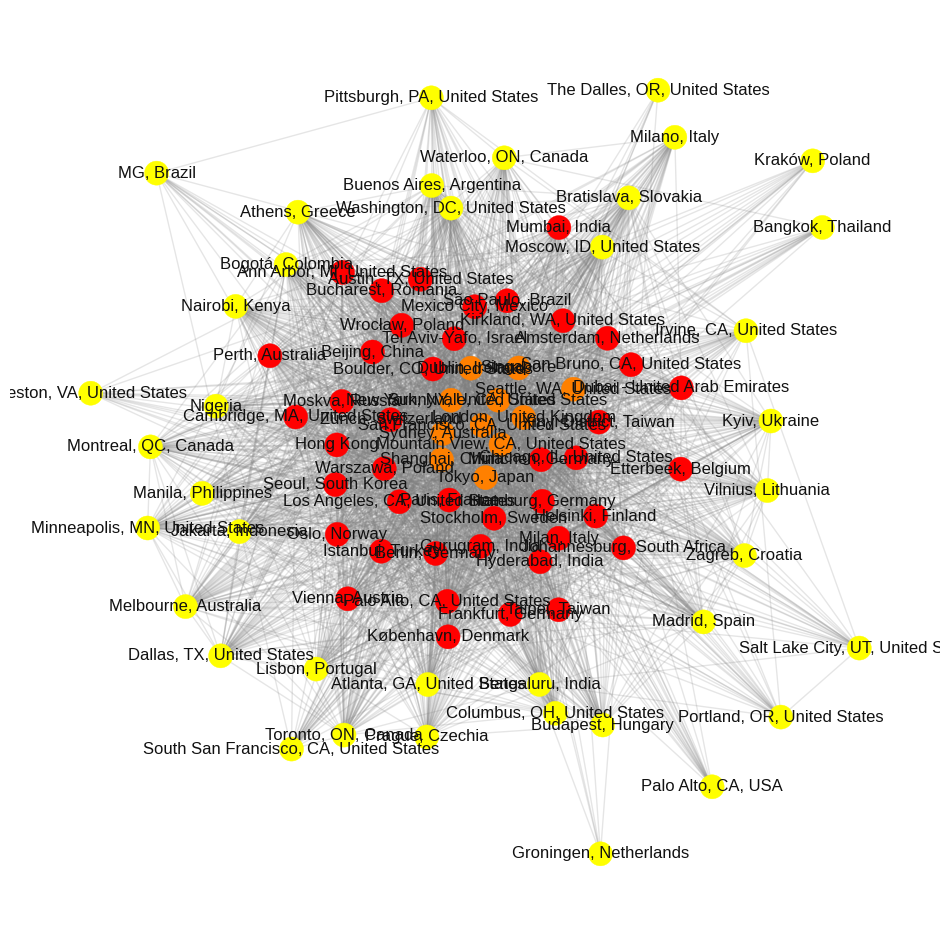

In [ ]:
#Hiển thị node và đồ thị phân cụm
print_communities(agg_node_groups)
plot_communities(G.nodes(), labels)

In [ ]:
df_copy = dt.copy()

# Add 'cluster' column to the copied DataFrame 'df_copy'
df_copy['cluster'] = -1  # Initialize with a default value, e.g., -1
for cluster, nodes in enumerate(agg_node_groups):
    df_copy.loc[df_copy['Location'].isin(nodes), 'cluster'] = cluster

# Display the copied DataFrame 'df_copy' with the added 'cluster' column
print(df_copy)
df_copy.to_csv('hierarchical.csv', index=False)

                              Category                          Location  \
0                   Program Management                         Singapore   
1         Manufacturing & Supply Chain                   Shanghai, China   
2                  Technical Solutions       New York, NY, United States   
3                  Developer Relations  Mountain View, CA, United States   
4                   Program Management      Sunnyvale, CA, United States   
...                                ...                               ...   
1245  Real Estate & Workplace Services        Boulder, CO, United States   
1246  Real Estate & Workplace Services        Boulder, CO, United States   
1247  Real Estate & Workplace Services            Xinyi District, Taiwan   
1248  Real Estate & Workplace Services             Tel Aviv-Yafo, Israel   
1249  Real Estate & Workplace Services                   Wrocław, Poland   

      cluster  
0           1  
1           1  
2           1  
3           1  
4      